<a href="https://colab.research.google.com/github/R3gm/InsightSolver-Colab/blob/main/SDXL_0_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stable Diffusion XL (SDXL)

| Code Credits | Link |
| ----------- | ---- |
| 🎉 Repository | [![GitHub Repository](https://img.shields.io/github/stars/Stability-AI/generative-models?style=social)](https://github.com/Stability-AI/generative-models) |
| 🔥 Discover More Colab Notebooks | [![GitHub Repository](https://img.shields.io/badge/GitHub-Repository-black?style=flat-square&logo=github)](https://github.com/R3gm/InsightSolver-Colab/) |



SDXL is a latent diffusion model used for text-to-image synthesis. It improves upon previous versions by incorporating a larger UNet backbone, resulting in a three-fold increase in model parameters. This enhancement is achieved through additional attention blocks and a larger cross-attention context, with the inclusion of a second text encoder. Multiple conditioning schemes and training on various aspect ratios are implemented. To further enhance visual fidelity, a refinement model utilizing post-hoc image-to-image techniques is introduced. SDXL outperforms previous versions of Stable Diffusion and competes with state-of-the-art image generators. To promote open research, code and model weights are made accessible.

![outpaint](https://japan.postsen.com/content/uploads/2023/07/05/b964533345.jpg)

- [View the SD-XL report.](https://github.com/Stability-AI/generative-models/blob/main/assets/sdxl_report.pdf)

In [1]:
!pip install invisible_watermark transformers accelerate safetensors diffusers --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 81.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.6/227.6 kB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 67.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 895.8/895.8 kB 71.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 109.9 MB/s eta 0:00:00
  Created wheel for diffusers: filename=diffusers-0.18.1-py3-none-any.whl size=1247776 sha256=07488e35c6e16799fcd5f7e3effda329932c82d6c815464f91d66c63971d446e
  Stored in directory: /root/.cache/pip/wheels/24/a6/0f/76cc29c67a153b1a711662ce4181c8463815f1186336ba07ec
Successfully built diffusers


One important step is to accept the license agreement for using SDXL. You need to have an account on Hugging Face and `accept the license to use the models`: https://huggingface.co/stabilityai/stable-diffusion-xl-base-0.9 and https://huggingface.co/stabilityai/stable-diffusion-xl-refiner-0.9




Get your KEY TOKEN here: https://hf.co/settings/tokens

In [1]:
YOUR_HF_TOKEN = "" #@param {type:"string"}

# Define the pipeline
- For base SDXL

In [2]:
from diffusers import DiffusionPipeline
import torch
import gc

model_base = "stabilityai/stable-diffusion-xl-base-0.9"

pipe = DiffusionPipeline.from_pretrained(
    model_base,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
    use_auth_token=YOUR_HF_TOKEN,
    )

pipe.to("cuda")

#pipe.enable_model_cpu_offload()
#pipe.enable_xformers_memory_efficient_attention()
#pipe.unet = torch.compile(pipe.unet, mode="reduce-overhead", fullgraph=True)

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.18.1",
  "force_zeros_for_empty_prompt": true,
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

- Refiner of SDXL.

In [3]:
model_refiner = "stabilityai/stable-diffusion-xl-refiner-0.9"

pipe_refiner = DiffusionPipeline.from_pretrained(
    model_refiner,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
    use_auth_token=YOUR_HF_TOKEN,
    )

#pipe_refiner.to("cuda")
pipe_refiner.enable_model_cpu_offload()

##  Generation with the base model.

In [10]:
# max 77 tokens in prompt
prompt = "full body,Cyber goth Geisha in the rain in a  tokyo future  city city wide, Pretty Face, Beautiful eyes, Anime, Portrait, Dark Aesthetic, Neon sunset blade runner background, Concept Art, Digital Art, Anime Art, unreal engine, greg rutkowski, loish, rhads, beeple, makoto shinkai, haruyo morita and lois"
negative_prompt = ''

image_base = pipe(
    prompt=prompt,
    #negative_prompt=negative_prompt,
    guidance_scale=9.0,
    num_inference_steps=50,
    ).images[0]

gc.collect()
torch.cuda.empty_cache()

  0%|          | 0/50 [00:00<?, ?it/s]

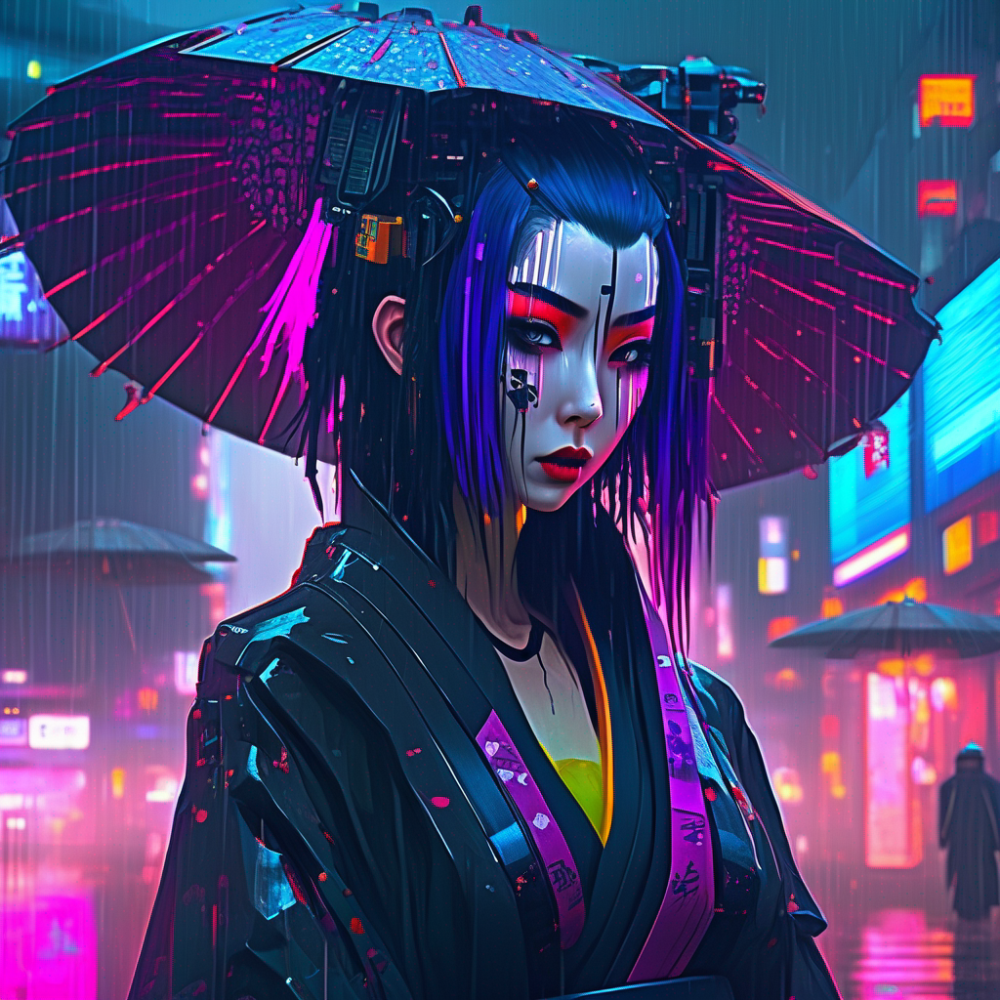

In [ ]:
image_base

##  Using the refiner with the generated image.

In [12]:
image_refiner = pipe_refiner(
    prompt=prompt,
    #negative_prompt=negative_prompt,
    image=image_base,
    num_inference_steps=50,
    strength=0.3,
    ).images[0]

gc.collect()
torch.cuda.empty_cache()

  0%|          | 0/15 [00:00<?, ?it/s]

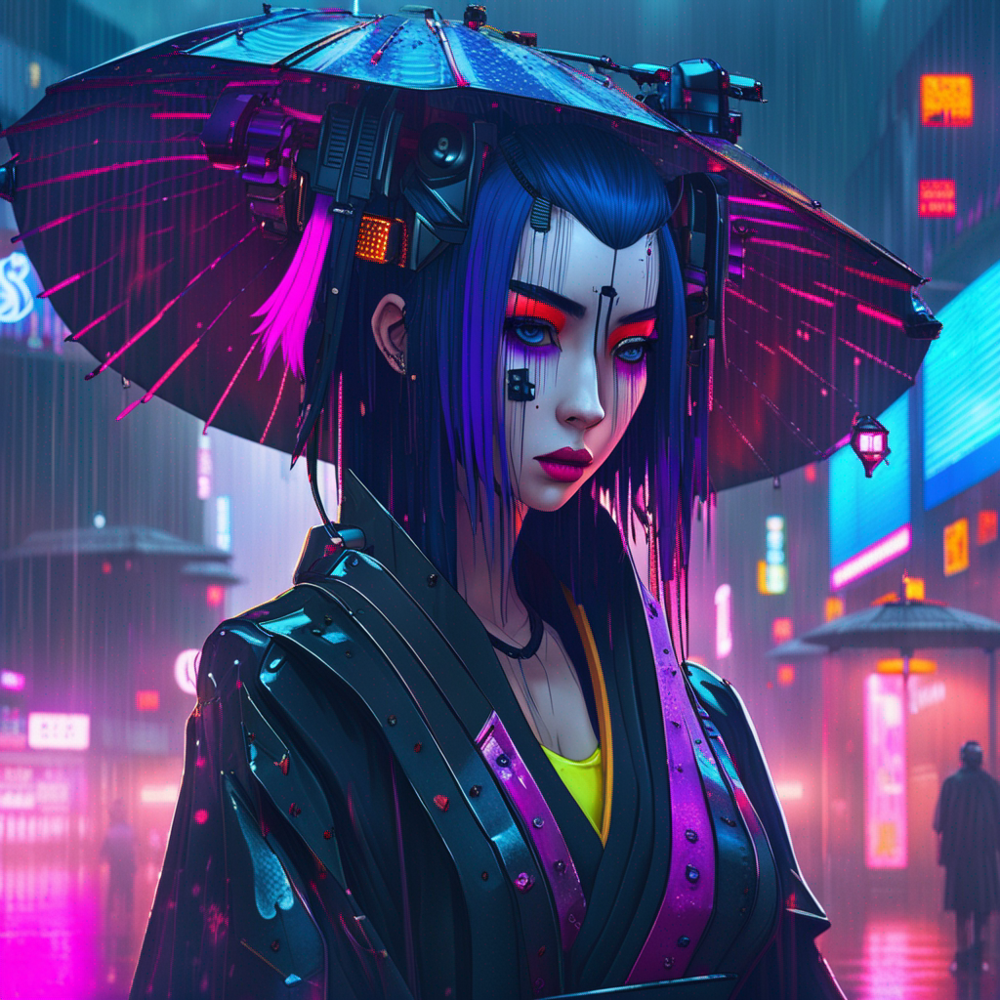

In [ ]:
image_refiner

## Using the latent space of the base image and directly passing it to the refiner.

  0%|          | 0/50 [00:00<?, ?it/s]

torch.Size([4, 128, 128])


  0%|          | 0/15 [00:00<?, ?it/s]

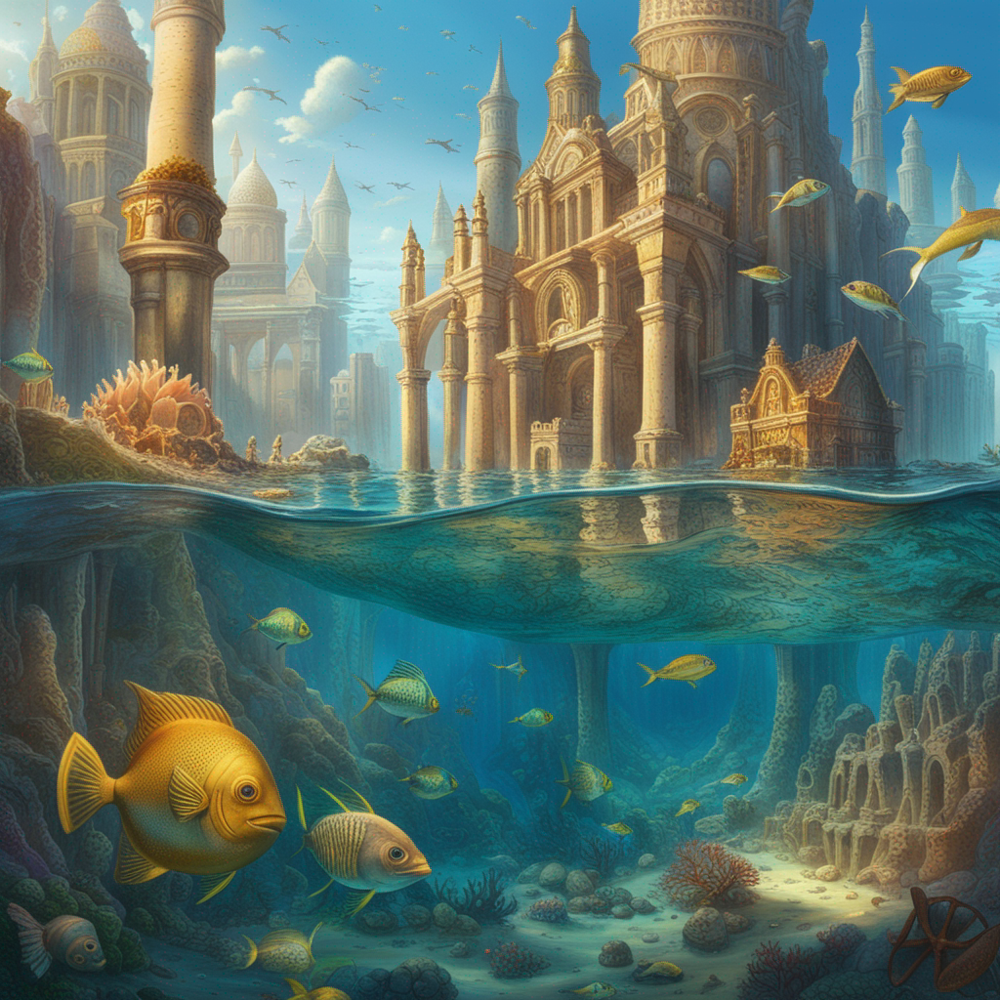

In [18]:
prompt = 'highly detailed portrait of an underwater city, with towering spires and domes rising up from the ocean floor. The city is bathed in a soft, golden light, and there is a sense of ancient mystery and wonder. The city is surrounded by a vibrant coral reef, with colorful fish swimming amongst the ruins. In the distance, there is a sunken shipwreck, aesthetic!!'
negative_prompt = ''

image_base_latent = pipe(
    prompt=prompt,
    #negative_prompt=negative_prompt,
    guidance_scale=9.0,
    num_inference_steps=50,
    output_type="latent",
    ).images[0]
print(image_base_latent.shape)

gc.collect()
torch.cuda.empty_cache()

image_refiner = pipe_refiner(
    prompt=prompt,
    #negative_prompt=negative_prompt,
    image=image_base_latent,
    num_inference_steps=15,
    strength=0.3,
    ).images[0]

gc.collect()
torch.cuda.empty_cache()

image_refiner

### Clarifications.
In certain types of images, the refiner may not be the best option, as is the case with these images.

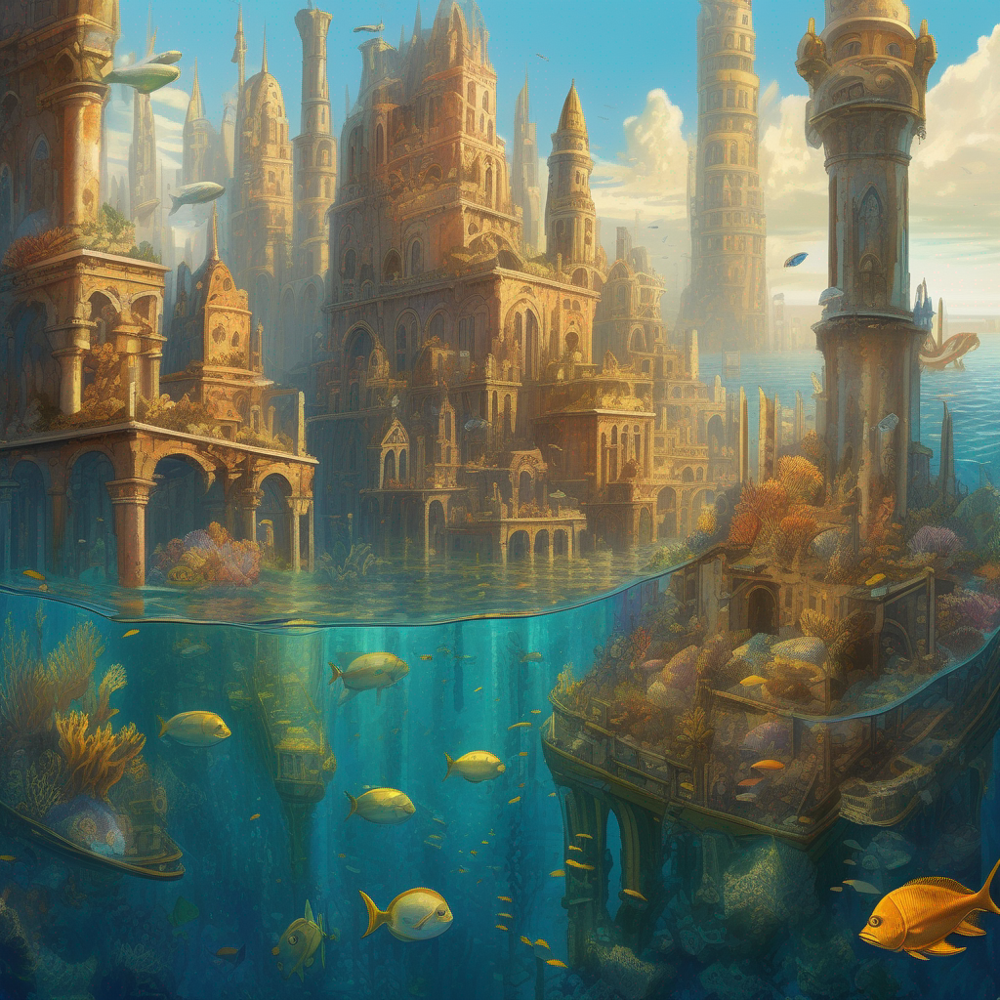

In [ ]:
# BASE IMAGE
#image_base

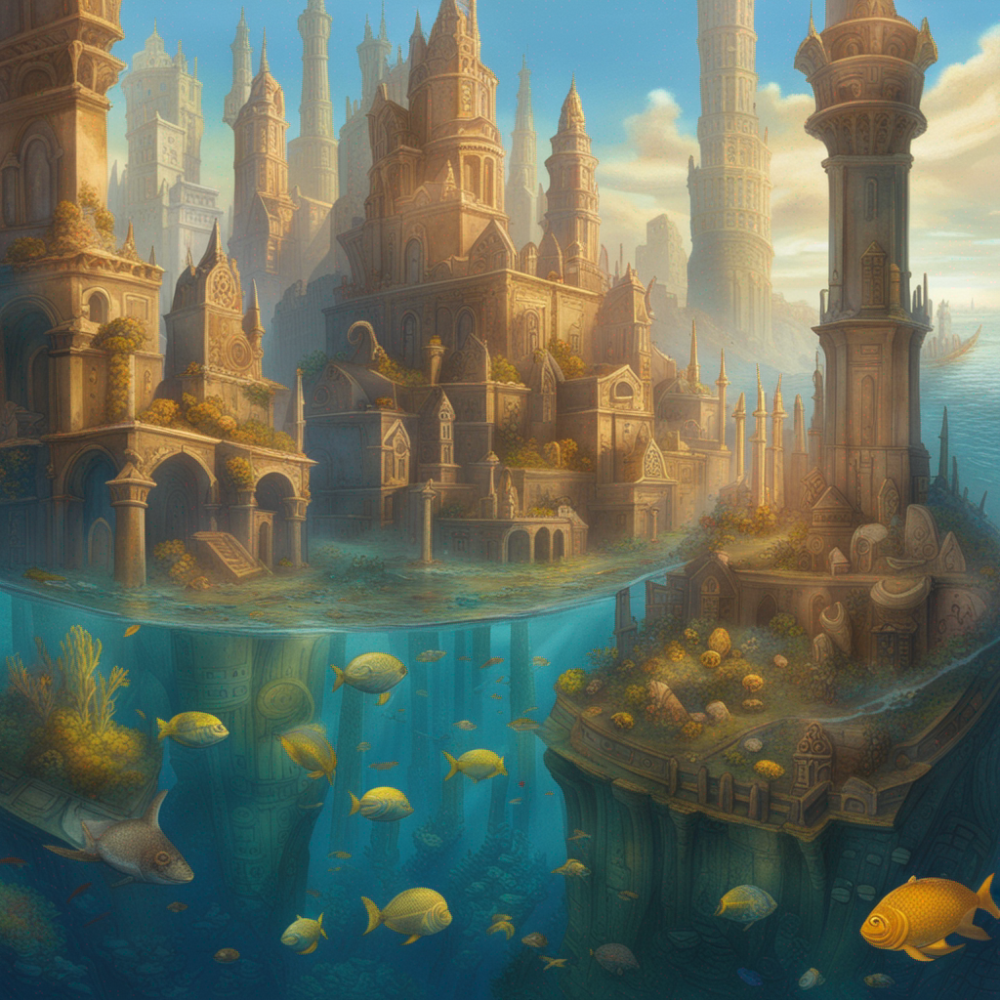

In [ ]:
# AFTER REFINER IMAGE, for better results change  the parameters num_inference_steps and strength
#image_refiner

# Samples run
- To run this cell, please restart the runtime and rerun the pipelines.

In [ ]:
def infer(prompt, negative, scale, samples=4, steps=50, refiner_steps=15, strength=0.3):
    prompt, negative = [prompt] * samples, [negative] * samples

    images_base = pipe(
        prompt=prompt,
        negative_prompt=negative,
        guidance_scale=scale,
        num_inference_steps=steps
        ).images

    gc.collect()
    torch.cuda.empty_cache()

    images_refiner = pipe_refiner(
        prompt=prompt,
        negative_prompt=negative,
        image=images_base,
        num_inference_steps=refiner_steps,
        strength=strength,
        ).images

    gc.collect()
    torch.cuda.empty_cache()

    return images_base, images_refiner

SAMPLES = 4 #@param {type:"integer"}
prompt = 'highly detailed portrait of an underwater city, with towering spires and domes rising up from the ocean floor. The city is bathed in a soft, golden light, and there is a sense of ancient mystery and wonder. The city is surrounded by a vibrant coral reef, with colorful fish swimming amongst the ruins. In the distance, there is a sunken shipwreck, aesthetic!!' #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
guidance_scale = 9.0 #@param {type:"number"}
steps = 50 #@param {type:"integer"}
refiner_steps = 15 #@param {type:"integer"}
strength = 0.3 #@param {type:"number"}

for i in range(SAMPLES):
    infer_images = infer(
        prompt = prompt,
        negative=negative_prompt,
        scale=guidance_scale,
        samples=1, #alternative free colab
        steps=steps,
        refiner_steps=refiner_steps,
        strength=strength,
    )

    print(f"Base Model, Image {i}")
    display(infer_images[0][0])
    print(f"Base + Refiner, Image {i}")
    display(infer_images[1][0])

# References

- https://clipdrop.co/stable-diffusion

- https://github.com/Stability-AI/generative-models

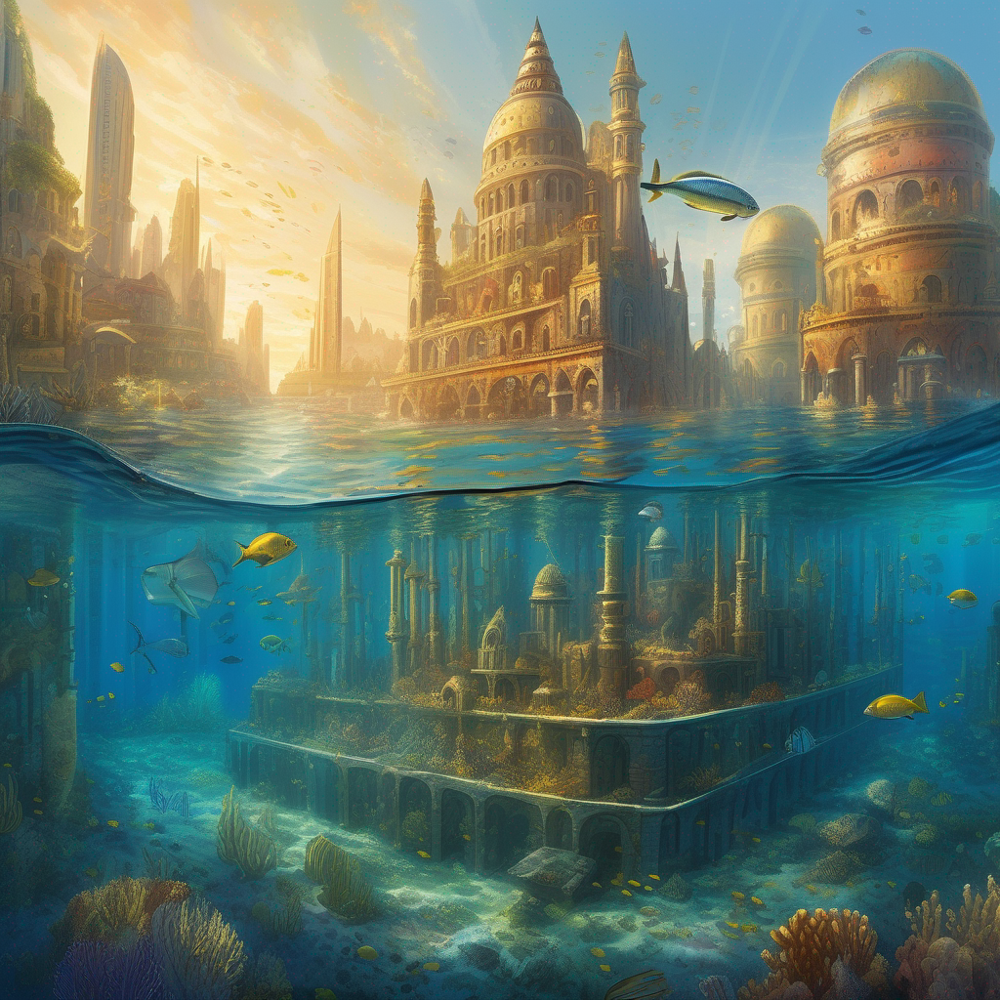

In [ ]:
#image_base